In [ ]:
from data_utils import *


DATA_ROOT = "../outputs/combined/"
FIGURE_ROOT = Path("../outputs/plots/cov")
N_RUNS = 100
N_EXAMPLES = 50000

model_df = get_model_df(DATA_ROOT)
MODEL_SUBSET = [
    {"key": "lottery_8ae667adac9b690a88b522e85f1388c8"},
    {"key": "lottery_cf40a5a8bbe4f285b8fe317c1aa95dd5"},
    {"key": "lottery_06562e05cda1bf840ee146490815ed82"},
    {"key": "lottery_9dc2b8dfff54c4da57570d7b391dcccd"},
]
model_df = multi_filter_df(model_df, MODEL_SUBSET)
model_df

/home/devin/miniconda3/envs/ml-torch/lib/python3.7/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


,model_key,dataset_key,Model,Dataset,Task,Parameters,path,key,n_replicates
5,cifar_resnet_20,cifar10,ResNet-20,CIFAR-10,CIFAR-10/ResNet-20,272474,../outputs/combined/lottery_8ae667adac9b690a88...,lottery_8ae667adac9b690a88b522e85f1388c8,100
8,cifar_vgg_16,cifar10,VGG-16,CIFAR-10,CIFAR-10/VGG-16,14728266,../outputs/combined/lottery_cf40a5a8bbe4f285b8...,lottery_cf40a5a8bbe4f285b8fe317c1aa95dd5,100
1,cifar_vgg_16,cifar100,VGG-16,CIFAR-100,CIFAR-100/VGG-16,14728266,../outputs/combined/lottery_06562e05cda1bf840e...,lottery_06562e05cda1bf840ee146490815ed82,100
6,cifar_resnet_20,cifar100,ResNet-20,CIFAR-100,CIFAR-100/ResNet-20,272474,../outputs/combined/lottery_9dc2b8dfff54c4da57...,lottery_9dc2b8dfff54c4da57570d7b391dcccd,100


In [2]:
SELECTED_SCORES = [
    {"key": "loss",
    "Method": "Training",
    "Type": ""},
    {"key": "margin",
    "Method": "Training",
    "Type": "",
    "Epoch": 160},
    {"key": "carlini_conf"},
    {"key": "batch_countforget",
    "Method": "Training",
    "Type": "",
    "Epoch": 160},
    {"key": "el2n",
    "Method": "One Step",
    "Type": "",
    "Epoch": 20},
    {"key": "classvog",
    "Method": "Training",
    "Type": "",
    "Epoch": 160},
    {"key": "selfproto",
    "Method": "One Step",
    "Type": "",
    "Epoch": 160},
    {"key": "pd",
    "Method": "One Step",
    "Type": "",
    "Epoch": 160},
    {"key": "carlini_ret"},
]

ALL_SCORES = [
    {"key": "carlini_agr"},
    {"key": "ddd",
    "Method": "Ensemble",
    "Type": "",
    "Epoch": 160},
    {"key": "ddd",
    "Method": "Ensemble",
    "Type": "",
    "Epoch": 20},
    {"key": "acc",
    "Method": "Training",
    "Type": "",
    "Epoch": 160},
    {"key": "acc",
    "Method": "One Step",
    "Type": "",
    "Epoch": 20},
    {"key": "loss",
    "Method": "Training",
    "Type": ""},
    {"key": "margin",
    "Method": "Training",
    "Type": "",
    "Epoch": 160},
    {"key": "conf",
    "Method": "Training",
    "Type": "",
    "Epoch": 160},
    {"key": "maxconf",
    "Method": "Training",
    "Type": "",
    "Epoch": 160},
    {"key": "carlini_conf"},
    {"key": "batch_countforget",
    "Method": "Training",
    "Type": "",
    "Epoch": 160},
    {"key": "countforget",
    "Method": "Training",
    "Type": "",
    "Epoch": 160},
    {"key": "batch_firstlearn",
    "Method": "Training",
    "Type": "",
    "Epoch": 160},
    {"key": "firstlearn",
    "Method": "Training",
    "Type": "",
    "Epoch": 160},
    {"key": "batch_firstunforgettable",
    "Method": "Training",
    "Type": "",
    "Epoch": 160},
    {"key": "firstunforgettable",
    "Method": "Training",
    "Type": "",
    "Epoch": 160},
    {"key": "batch_unforgettable",
    "Method": "Training",
    "Type": "",
    "Epoch": 160},
    {"key": "unforgettable",
    "Method": "Training",
    "Type": "",
    "Epoch": 160},
    {"key": "el2n",
    "Method": "One Step",
    "Type": "",
    "Epoch": 20},
    {"key": "el2n",
    "Method": "Training",
    "Type": "",
    "Epoch": 160},
    {"key": "grand",
    "Method": "One Step",
    "Type": "",
    "Epoch": 20},
    {"key": "grand",
    "Method": "One Step",
    "Type": "",
    "Epoch": 160},
    {"key": "classvog",
    "Method": "Training",
    "Type": "",
    "Epoch": 160},
    {"key": "lossvog",
    "Method": "Training",
    "Type": "",
    "Epoch": 160},
    {"key": "proto",
    "Method": "One Step",
    "Type": "",
    "Epoch": 160},
    {"key": "proto",
    "Method": "One Step",
    "Type": "",
    "Epoch": 20},
    {"key": "selfproto",
    "Method": "One Step",
    "Type": "",
    "Epoch": 160},
    {"key": "selfproto",
    "Method": "One Step",
    "Type": "",
    "Epoch": 20},
    {"key": "swav_selfproto"},
    {"key": "pd",
    "Method": "One Step",
    "Type": "",
    "Epoch": 160},
    {"key": "pd",
    "Method": "One Step",
    "Type": "",
    "Epoch": 20},
    {"key": "carlini_ret"},
    {"key": "carlini_adv"},
    {"key": "carlini_priv"},
    {"key": "memorization"},
    {"key": "memorization_inception"},
]

In [3]:
def plot_avg_avg_corr(scores, title, name=None):
    mean_scores = [np.mean(x, axis=0) if row["Method"] != "Ensemble" else x for row, x in scores]
    names = [("$-1 \\times$" if row["is_inverted"] else "") + row["Full Name"] for row, _ in scores]

    matrix = corr_matrix(mean_scores)
    plot_corr_matrix(matrix, title=title, label_a="Mean Score", ticklabels_a=names)
    save_fig(FIGURE_ROOT, "avg_avg_corr", name=name, figsize=(matrix.shape[0] * 0.5 + 3, matrix.shape[1] * 0.5 + 3))


def plot_avg_ind_corr(scores, title, name=None):
    mean_scores = [np.mean(x, axis=0) if row["Method"] != "Ensemble" else x for row, x in scores]
    names = [("$-1 \\times$" if row["is_inverted"] else "") + row["Full Name"] for row, _ in scores]
    ind_scores = [x for row, x in scores  if row["Method"] != "Ensemble"]
    ind_names = [("$-1 \\times$" if row["is_inverted"] else "") + row["Full Name"] for row, x in scores if row["Method"] != "Ensemble"]

    matrix = corr_matrix(mean_scores, ind_scores)
    plot_corr_matrix(matrix, title=title, label_a="Mean Score", ticklabels_a=names, label_b="Per-Run Score", ticklabels_b=ind_names)
    save_fig(FIGURE_ROOT, "avg_ind_corr", name=name, figsize=(matrix.shape[0] * 0.65 + 3, matrix.shape[1] * 0.65 + 3))
    return matrix, names, ind_names


def subset_matrix(matrix, row_names, col_names, target_names):
    i = 0
    subset = []
    for k in target_names:
        while row_names[i] != k:
            i += 1
        subset.append(matrix[i, :])
    matrix = np.stack(subset, axis=0)

    i = 0
    subset = []
    for k in target_names:
        while col_names[i] != k:
            i += 1
        subset.append(matrix[:, i])
    matrix = np.stack(subset, axis=1)
    return matrix


def plot_avg_ind_vs_ind_ind_corr_diff(scores, avg_ind_matrix, avg_names, ind_names, title, name=None):
    ind_scores = [x for row, x in scores if row["Method"] != "Ensemble"]
    names = [("$-1 \\times$" if row["is_inverted"] else "") + row["Full Name"] for row, x in scores if row["Method"] != "Ensemble"]
    ind_ind_matrix = corr_matrix(ind_scores)

    # take difference between avg_ind_matrix and ind_ind_matrix, making sure to match the names
    avg_ind_matrix = subset_matrix(avg_ind_matrix, avg_names, ind_names, names)
    assert avg_ind_matrix.shape == ind_ind_matrix.shape
    matrix = ind_ind_matrix - avg_ind_matrix

    plot_corr_matrix(matrix, title=title, label_a="Mean Score", ticklabels_a=names, label_b="Per-Run Score", show_negative=True)
    save_fig(FIGURE_ROOT, "avg_ind_vs_ind_ind_corr_diff", name=name, figsize=(matrix.shape[0] * 0.5 + 4, matrix.shape[1] * 0.5 + 4))



model_key                                         cifar_resnet_20
dataset_key                                               cifar10
Model                                                   ResNet-20
Dataset                                                  CIFAR-10
Task                                           CIFAR-10/ResNet-20
Parameters                                                 272474
path            ../outputs/combined/lottery_8ae667adac9b690a88...
key                      lottery_8ae667adac9b690a88b522e85f1388c8
n_replicates                                                  100
Name: 5, dtype: object
Unable to load memorization: Combination does not exist: , cifar10
Saving figure to ../outputs/plots/cov/CIFAR-10-ResNet-20_selected_avg_avg_corr.pdf


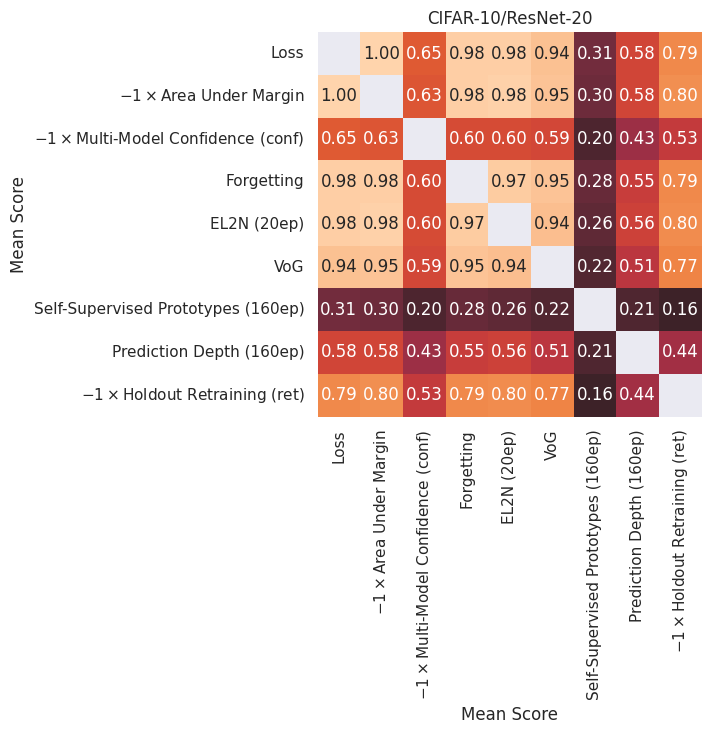

Saving figure to ../outputs/plots/cov/CIFAR-10-ResNet-20_selected_avg_ind_corr.pdf


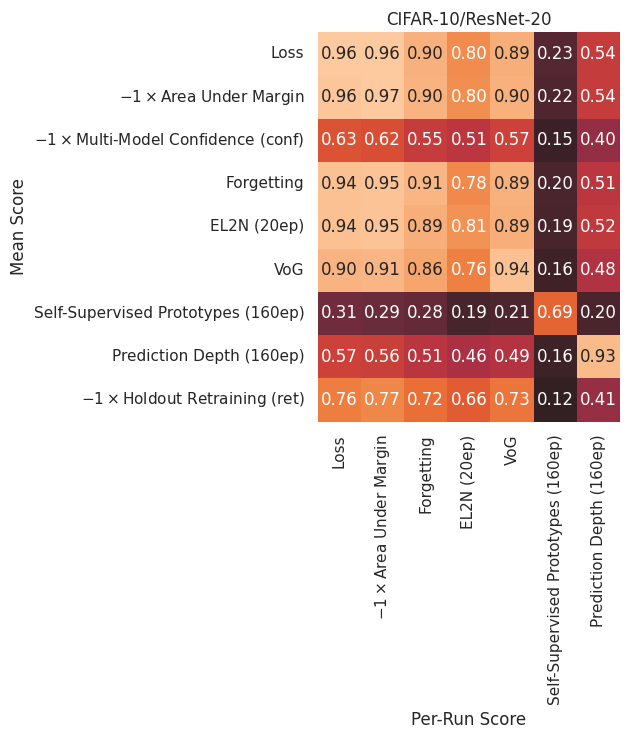

Saving figure to ../outputs/plots/cov/CIFAR-10-ResNet-20_selected_avg_ind_vs_ind_ind_corr_diff.pdf


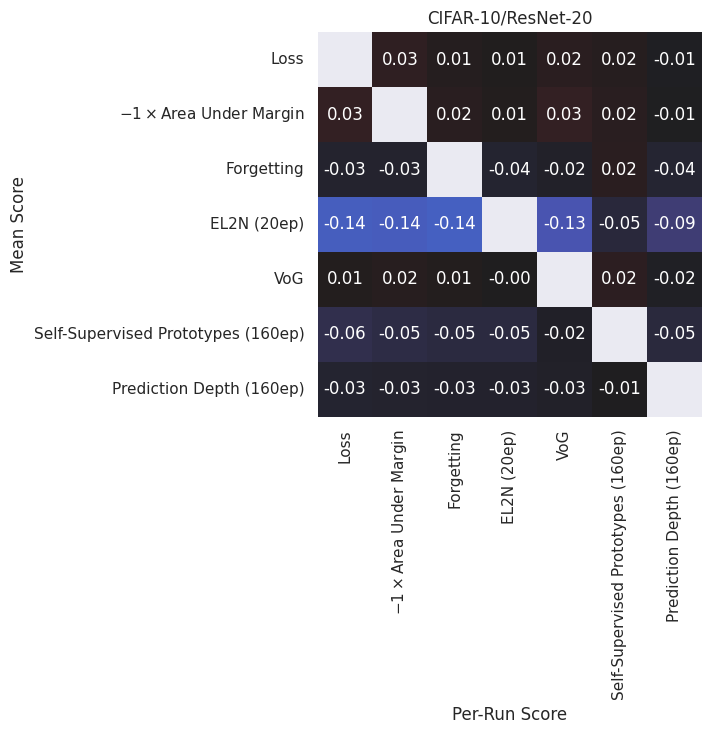

Saving figure to ../outputs/plots/cov/CIFAR-10-ResNet-20_avg_avg_corr.pdf


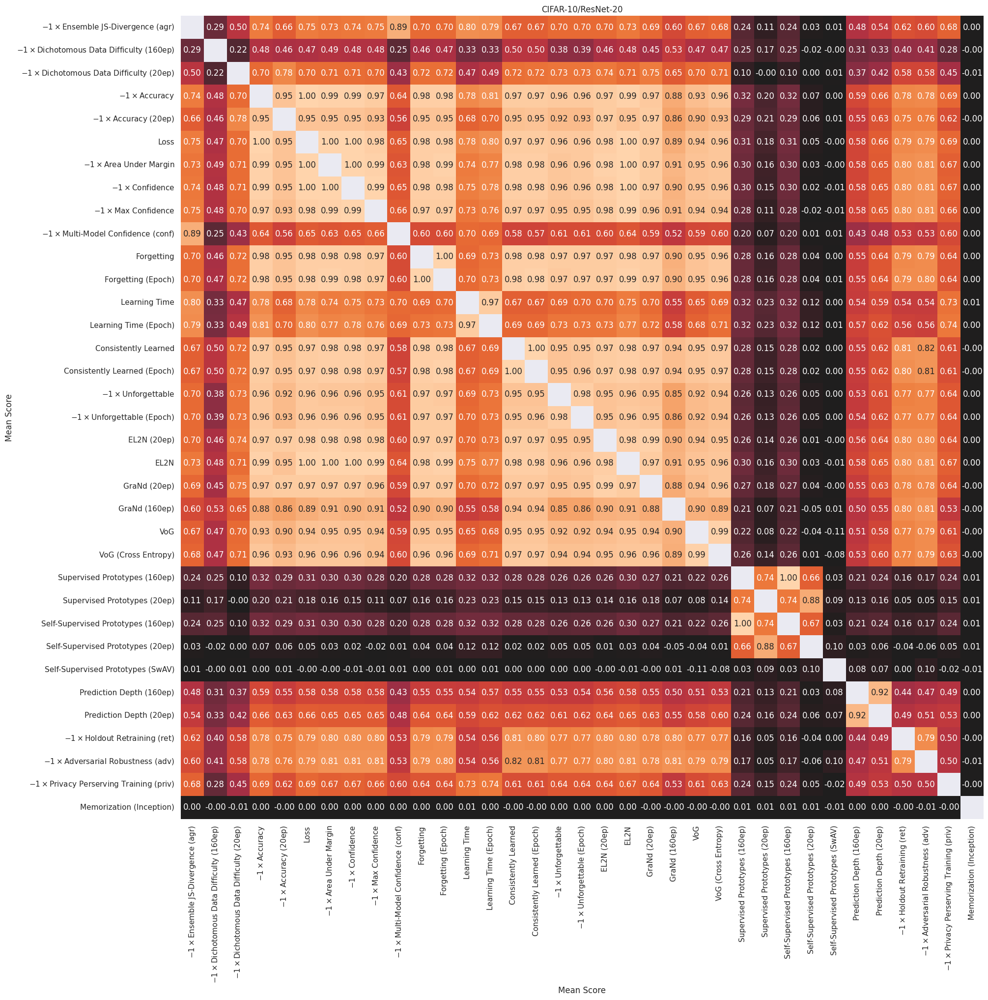

Saving figure to ../outputs/plots/cov/CIFAR-10-ResNet-20_avg_ind_corr.pdf


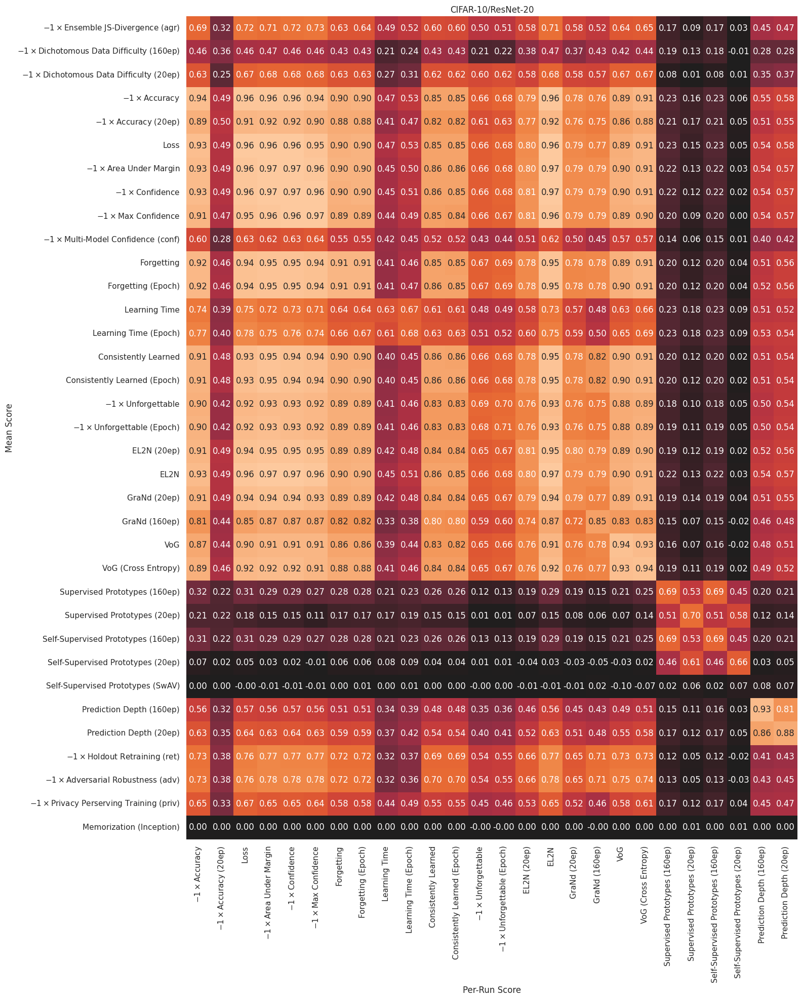

Saving figure to ../outputs/plots/cov/CIFAR-10-ResNet-20_avg_ind_vs_ind_ind_corr_diff.pdf


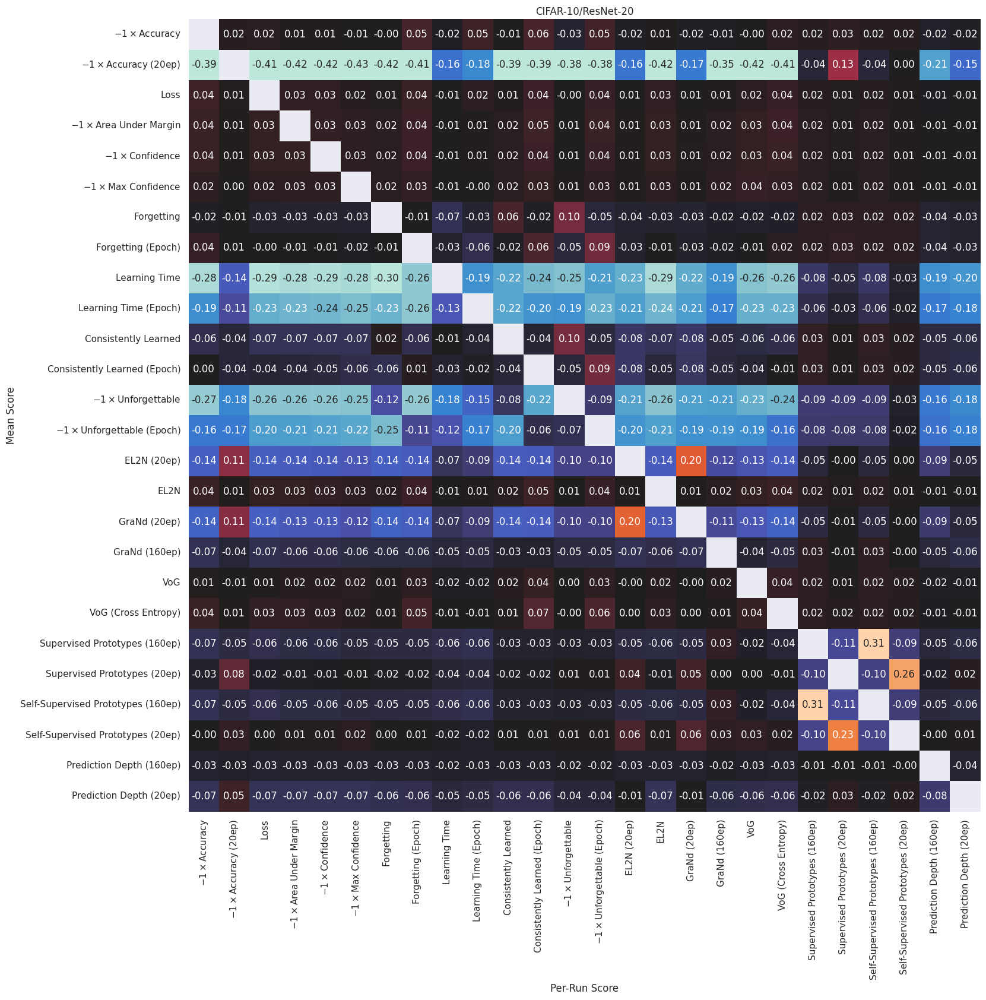

model_key                                            cifar_vgg_16
dataset_key                                               cifar10
Model                                                      VGG-16
Dataset                                                  CIFAR-10
Task                                              CIFAR-10/VGG-16
Parameters                                               14728266
path            ../outputs/combined/lottery_cf40a5a8bbe4f285b8...
key                      lottery_cf40a5a8bbe4f285b8fe317c1aa95dd5
n_replicates                                                  100
Name: 8, dtype: object
Unable to load memorization: Combination does not exist: , cifar10
Saving figure to ../outputs/plots/cov/CIFAR-10-VGG-16_selected_avg_avg_corr.pdf


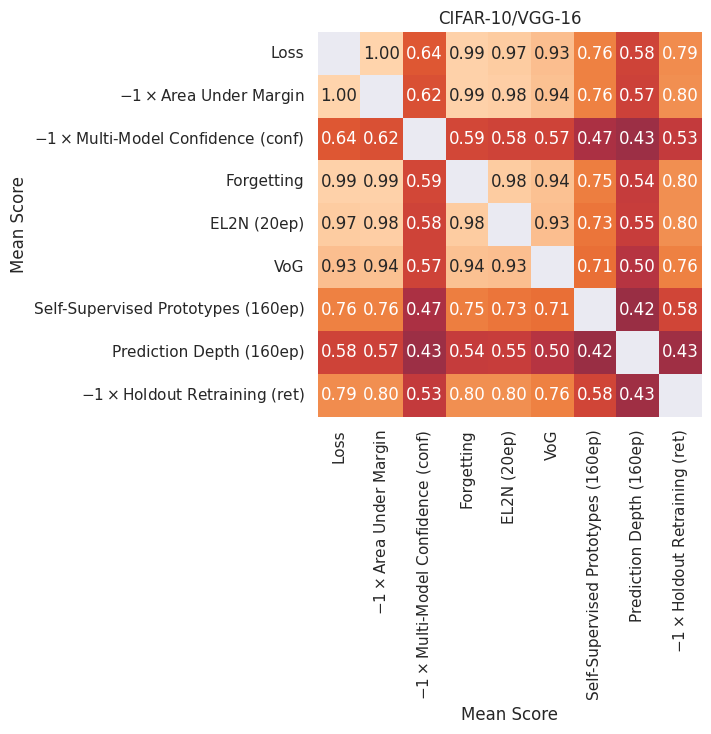

Saving figure to ../outputs/plots/cov/CIFAR-10-VGG-16_selected_avg_ind_corr.pdf


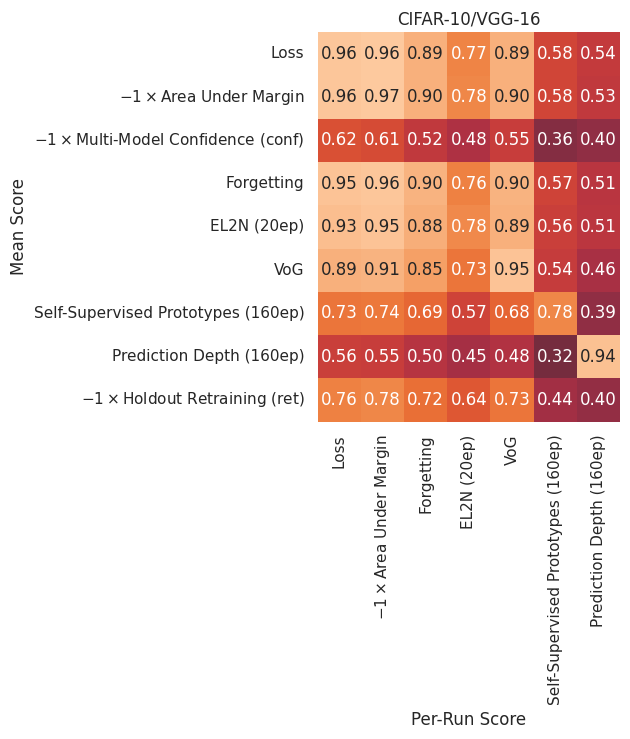

Saving figure to ../outputs/plots/cov/CIFAR-10-VGG-16_selected_avg_ind_vs_ind_ind_corr_diff.pdf


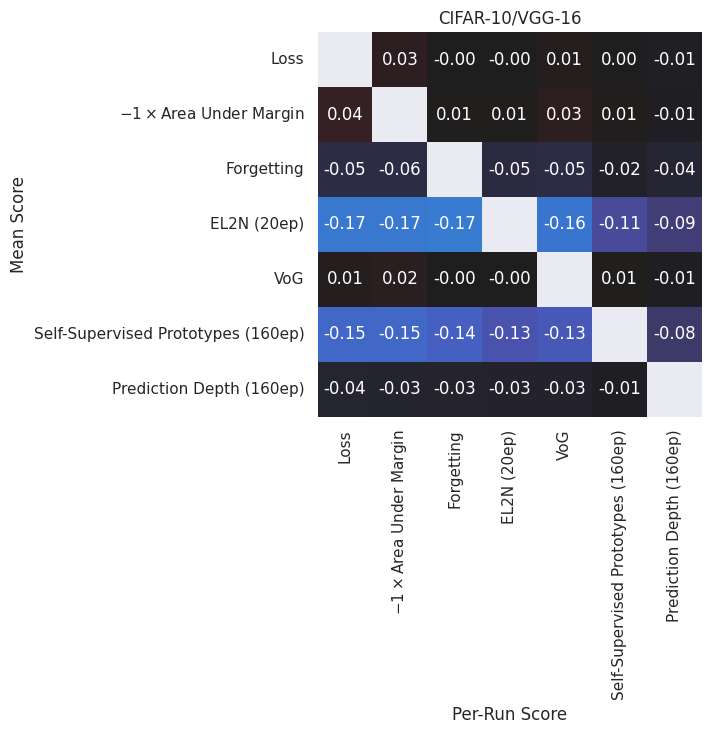

Saving figure to ../outputs/plots/cov/CIFAR-10-VGG-16_avg_avg_corr.pdf


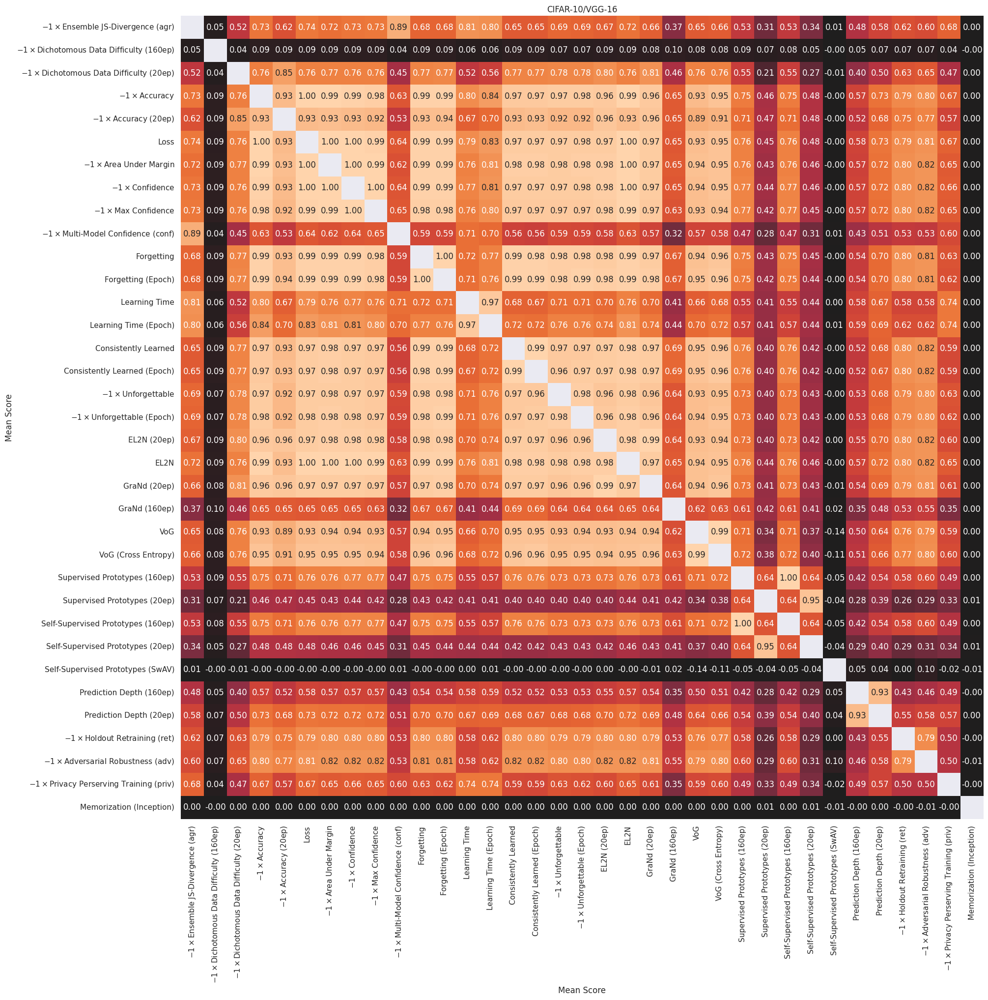

Saving figure to ../outputs/plots/cov/CIFAR-10-VGG-16_avg_ind_corr.pdf


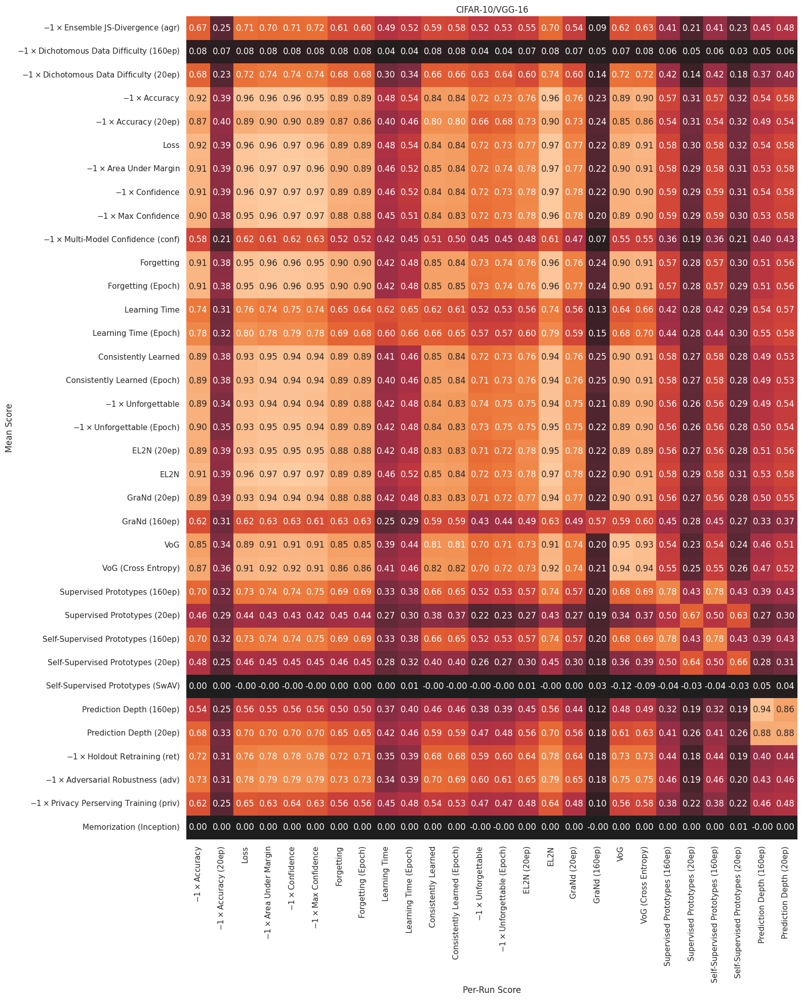

Saving figure to ../outputs/plots/cov/CIFAR-10-VGG-16_avg_ind_vs_ind_ind_corr_diff.pdf


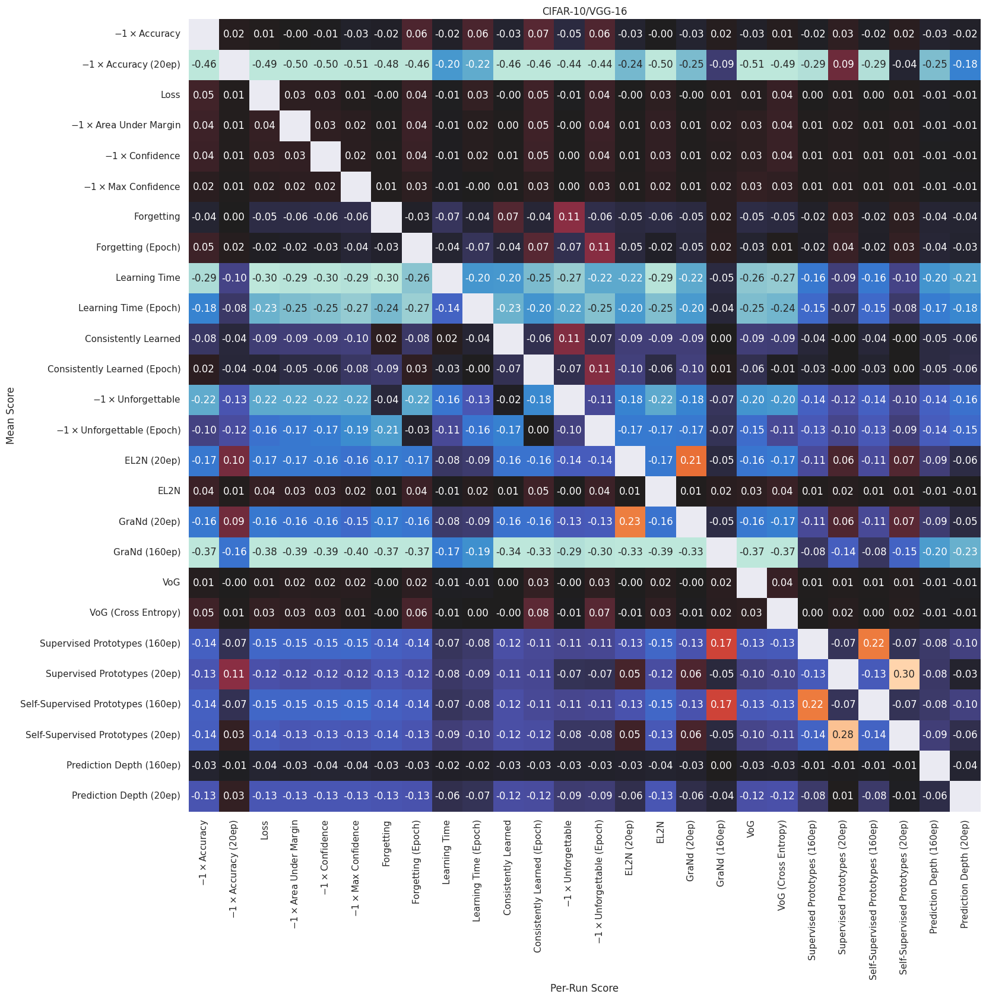

model_key                                            cifar_vgg_16
dataset_key                                              cifar100
Model                                                      VGG-16
Dataset                                                 CIFAR-100
Task                                             CIFAR-100/VGG-16
Parameters                                               14728266
path            ../outputs/combined/lottery_06562e05cda1bf840e...
key                      lottery_06562e05cda1bf840ee146490815ed82
n_replicates                                                  100
Name: 1, dtype: object
Grad and ckpt scores differ for ../outputs/combined/lottery_06562e05cda1bf840ee146490815ed82/replicate_100/level_0/main/gradmetrics/grand_20ep0it.npz: n=250, atol %=0.01470849338407377
Grad and ckpt scores differ for ../outputs/combined/lottery_06562e05cda1bf840ee146490815ed82/replicate_43/level_0/main/gradmetrics/grand_20ep0it.npz: n=270, atol %=0.01612396276328777
Grad and ckpt 

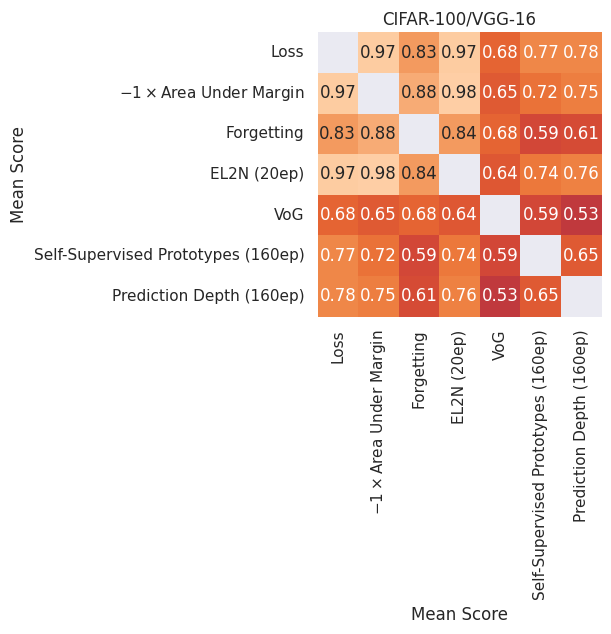

Saving figure to ../outputs/plots/cov/CIFAR-100-VGG-16_selected_avg_ind_corr.pdf


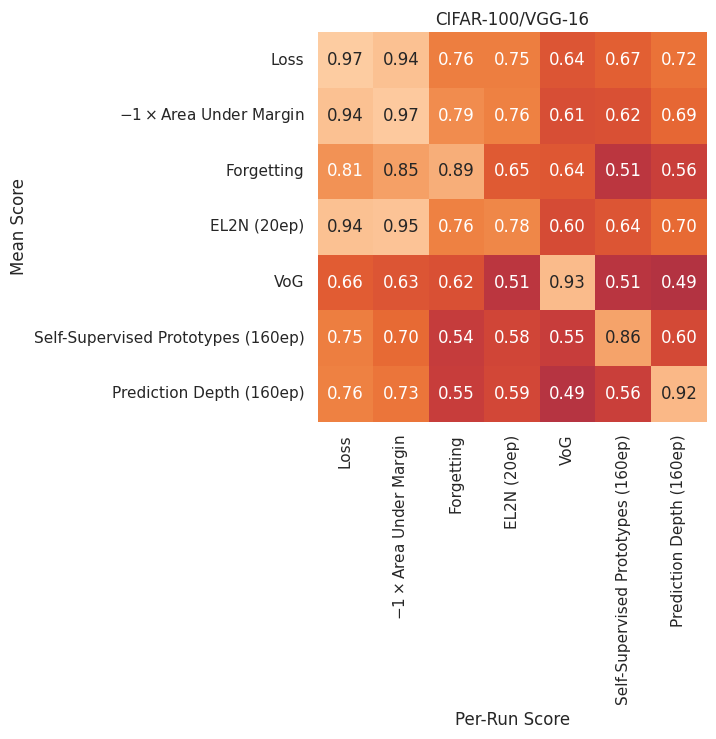

Saving figure to ../outputs/plots/cov/CIFAR-100-VGG-16_selected_avg_ind_vs_ind_ind_corr_diff.pdf


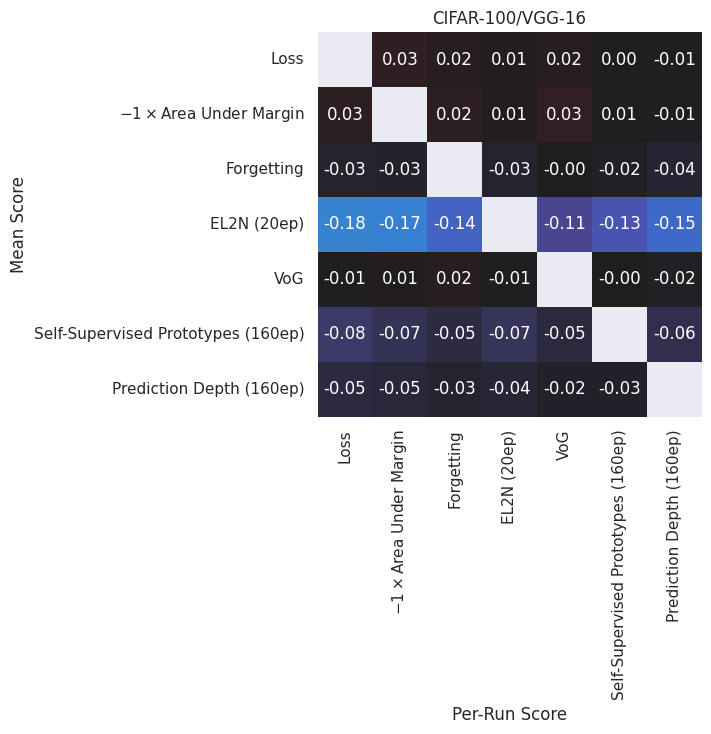

Saving figure to ../outputs/plots/cov/CIFAR-100-VGG-16_avg_avg_corr.pdf


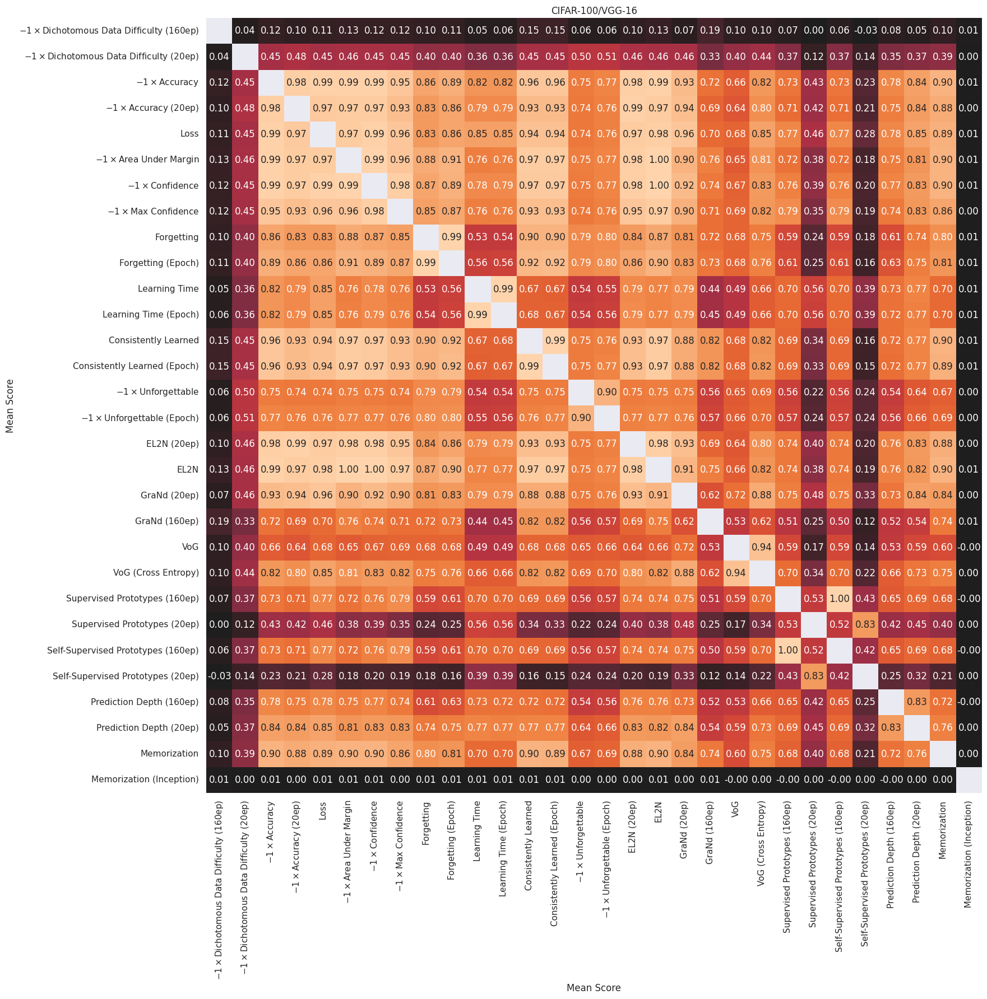

Saving figure to ../outputs/plots/cov/CIFAR-100-VGG-16_avg_ind_corr.pdf


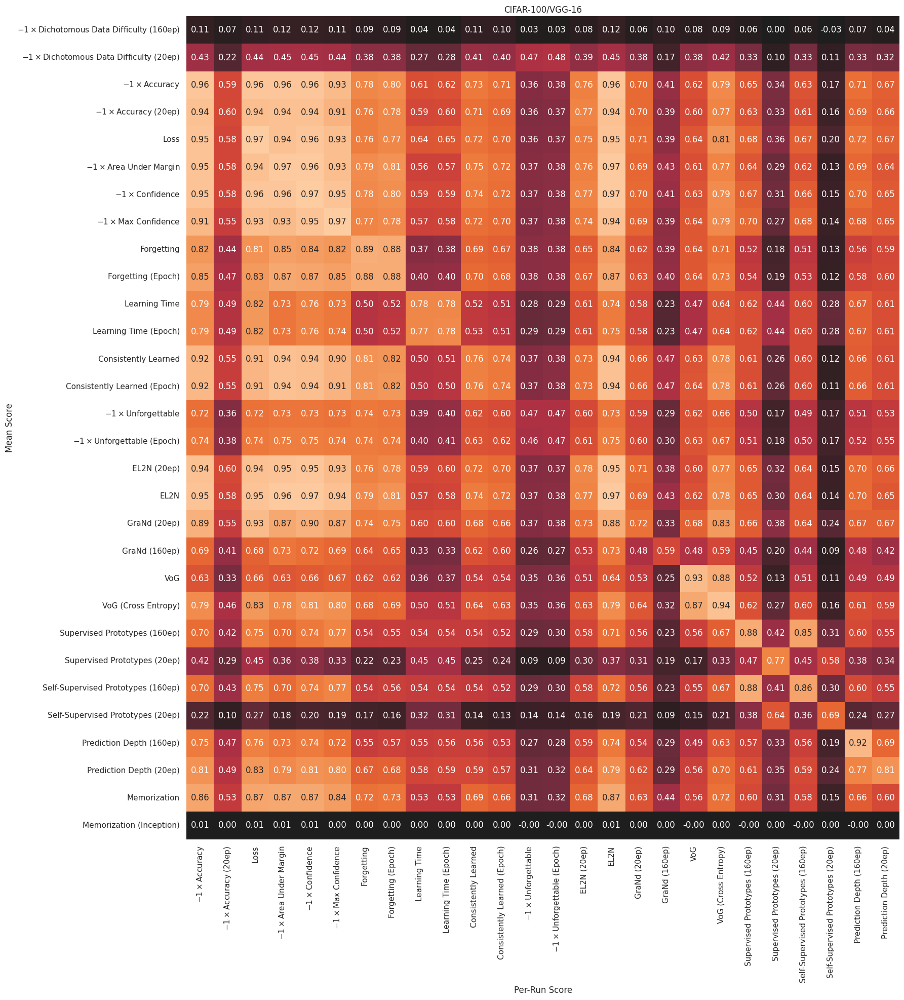

Saving figure to ../outputs/plots/cov/CIFAR-100-VGG-16_avg_ind_vs_ind_ind_corr_diff.pdf


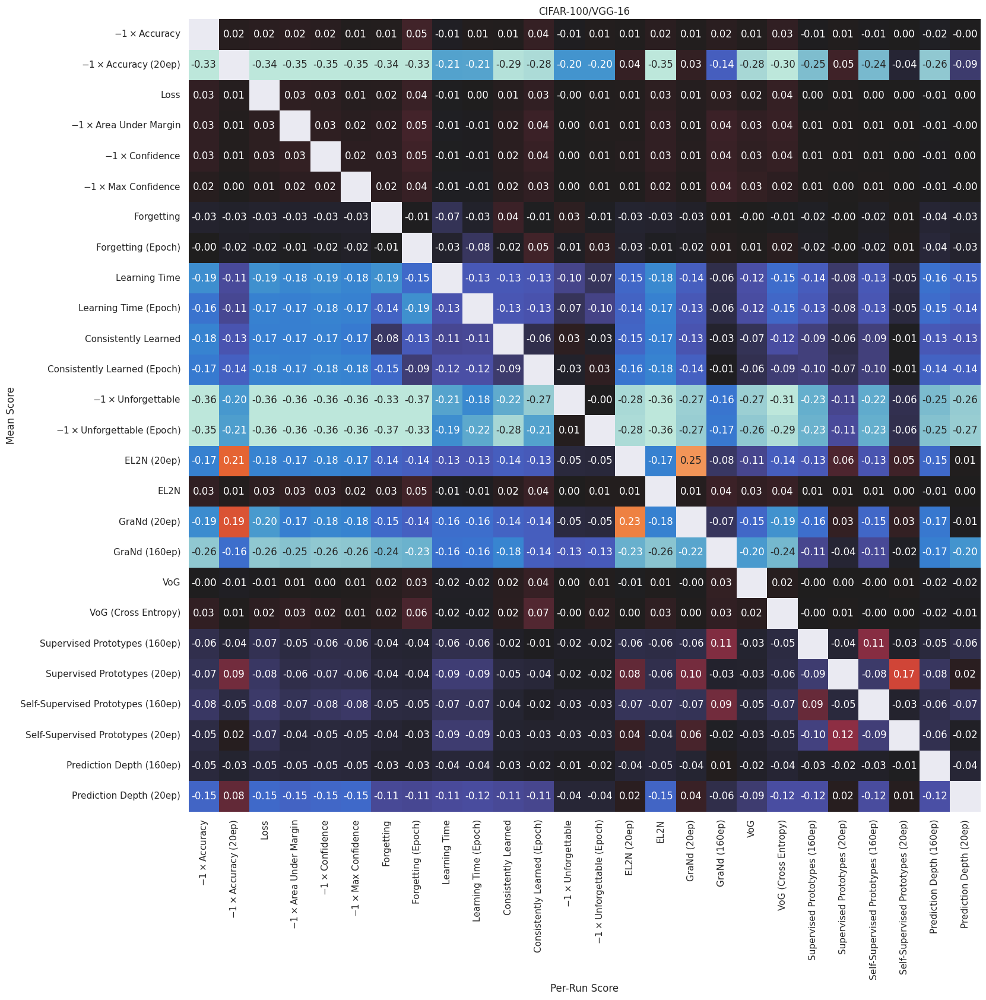

model_key                                         cifar_resnet_20
dataset_key                                              cifar100
Model                                                   ResNet-20
Dataset                                                 CIFAR-100
Task                                          CIFAR-100/ResNet-20
Parameters                                                 272474
path            ../outputs/combined/lottery_9dc2b8dfff54c4da57...
key                      lottery_9dc2b8dfff54c4da57570d7b391dcccd
n_replicates                                                  100
Name: 6, dtype: object
Grad and ckpt scores differ for ../outputs/combined/lottery_9dc2b8dfff54c4da57570d7b391dcccd/replicate_54/level_0/main/gradmetrics/grand_20ep0it.npz: n=61, atol %=0.011354232836572874
Grad and ckpt scores differ for ../outputs/combined/lottery_9dc2b8dfff54c4da57570d7b391dcccd/replicate_56/level_0/main/gradmetrics/grand_20ep0it.npz: n=50, atol %=0.01291863552310424
Grad and ckpt sc

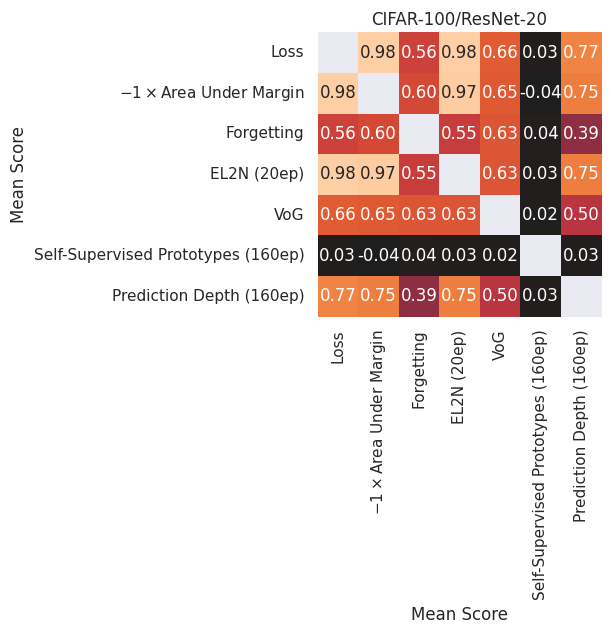

Saving figure to ../outputs/plots/cov/CIFAR-100-ResNet-20_selected_avg_ind_corr.pdf


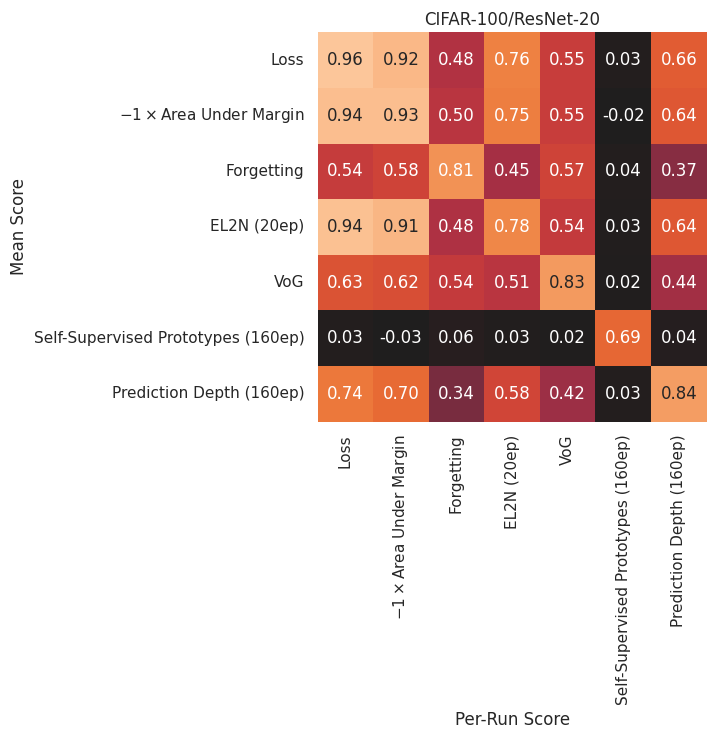

Saving figure to ../outputs/plots/cov/CIFAR-100-ResNet-20_selected_avg_ind_vs_ind_ind_corr_diff.pdf


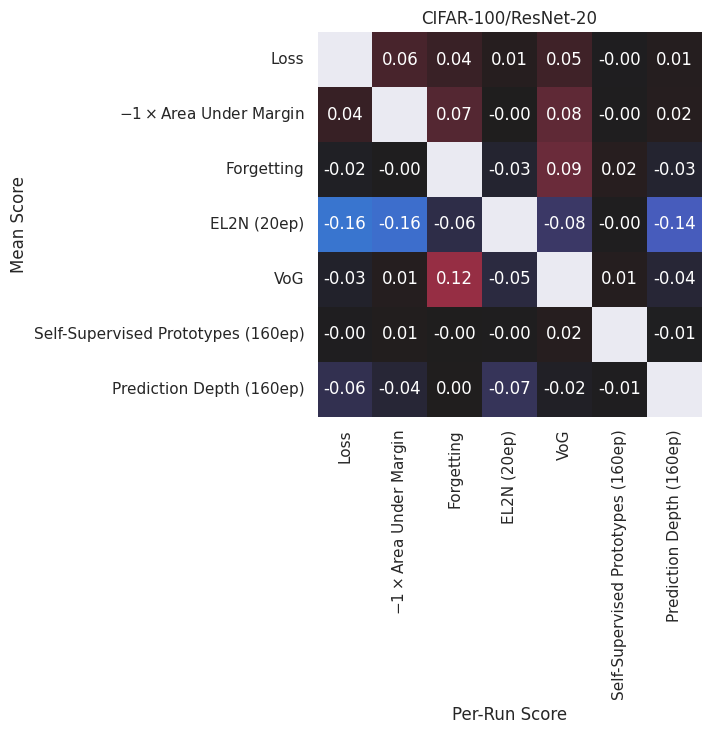

Saving figure to ../outputs/plots/cov/CIFAR-100-ResNet-20_avg_avg_corr.pdf


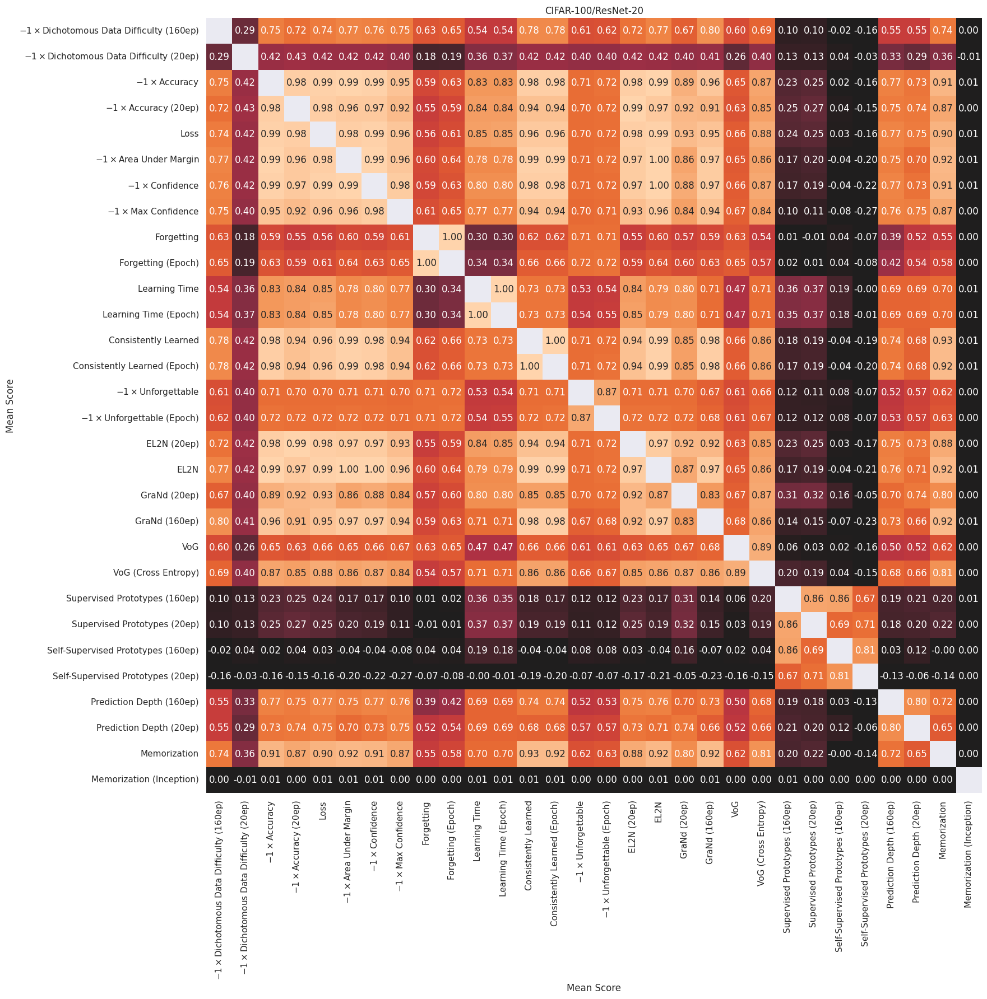

Saving figure to ../outputs/plots/cov/CIFAR-100-ResNet-20_avg_ind_corr.pdf


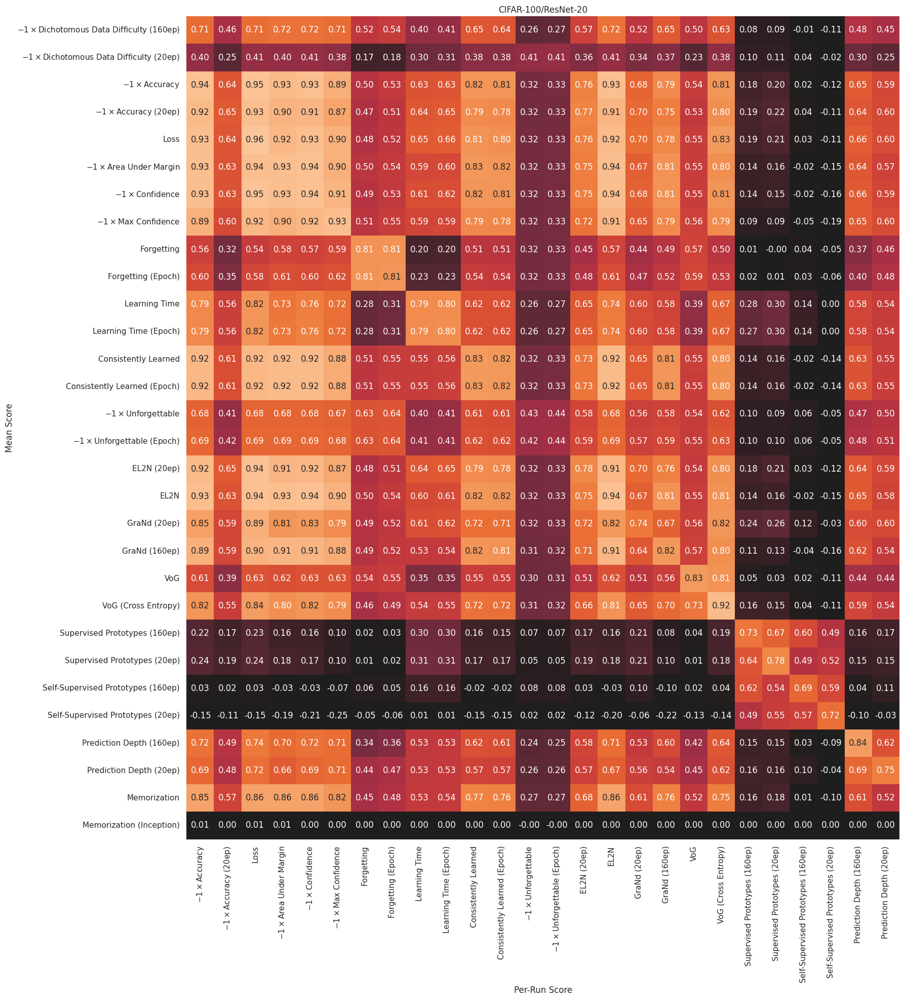

Saving figure to ../outputs/plots/cov/CIFAR-100-ResNet-20_avg_ind_vs_ind_ind_corr_diff.pdf


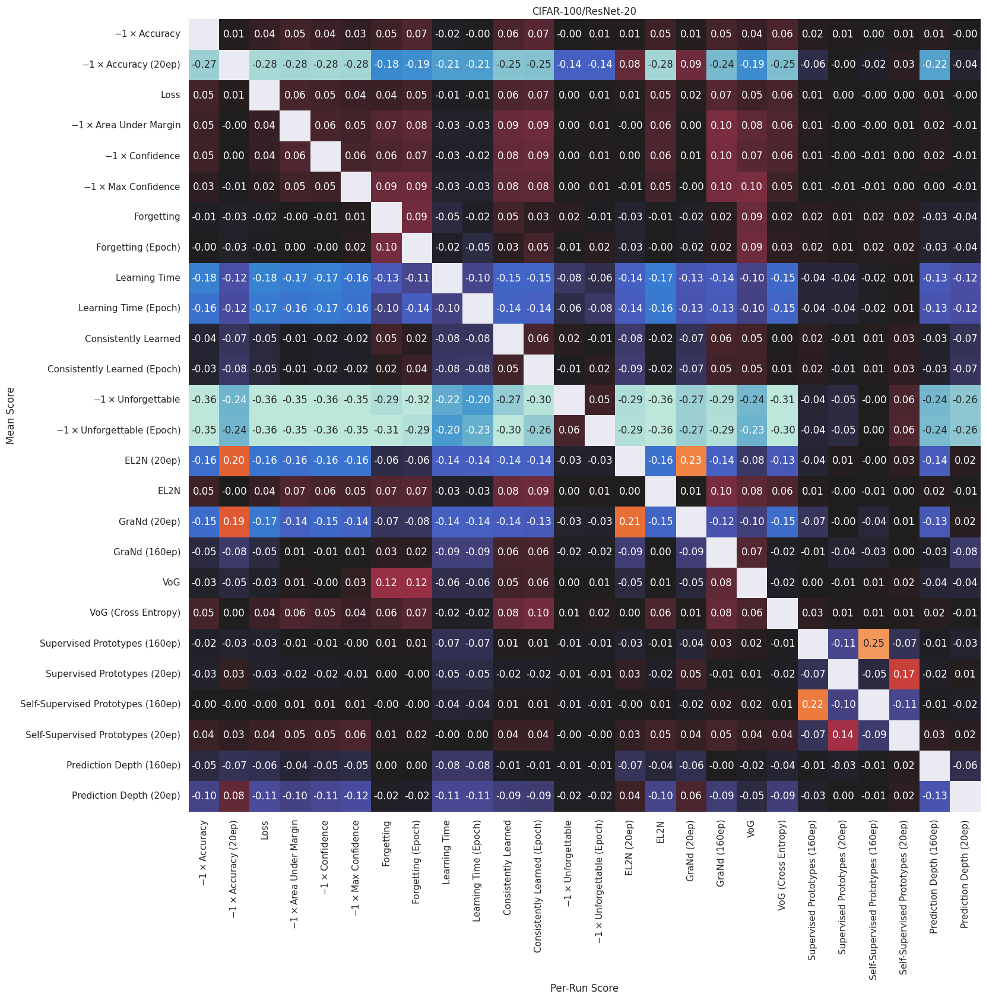

<Figure size 640x480 with 0 Axes>

In [4]:
for _, model_row in model_df.iterrows():
    print(model_row)
    sanity_checks(model_row["path"])
    task_name = model_row["Task"]

    score_df = get_score_df(model_row, n_replicates=N_RUNS, get_precomputed=True)
    score_df = score_df[score_df["Epoch"] != 0]

    df = get_scores(score_df, n_examples=N_EXAMPLES, fuzz_by=0)
    training_loss = aggregate_steps(df[df["key"] == "loss"])
    df = pd.concat([df, training_loss])
    df = df[df["Type"] == ""]

    selected_scores = [
        ("_selected", SELECTED_SCORES),
        ("", ALL_SCORES),
    ]

    for name, attrs in selected_scores:
        scores = list(get_selected_scores(df, attrs, strict=False))
        plot_avg_avg_corr(scores, title=task_name, name=task_name + name)
        matrix, labels_a, labels_b = plot_avg_ind_corr(scores, title=task_name, name=task_name + name)
        plot_avg_ind_vs_ind_ind_corr_diff(scores, matrix, labels_a, labels_b, title=task_name, name=task_name + name)